In [2]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# for everything else
import os
import numpy as np
import matplotlib.pyplot as plt
from random import randint
import pandas as pd
import pickle

import torch
import torch.nn as nn
from torchvision import models, transforms

from PIL import Image

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

import pytorch_lightning as pl
from torch.utils.data import DataLoader, TensorDataset
import torch.optim as optim
from pytorch_lightning import Trainer
from RESNET101 import resnet101, ResNet101_Weights
import torch
import numpy as np
import cv2

from sklearn.preprocessing import LabelEncoder
from scipy.stats import mannwhitneyu
from scipy.optimize import linear_sum_assignment
import matplotlib.patches as mpatches
from sklearn.preprocessing import RobustScaler
import igraph as ig
import networkx as nx
import community.community_louvain as cl
from sklearn.neighbors import kneighbors_graph
import sknetwork as skn
from sknetwork.clustering import Louvain
from sklearn.metrics import adjusted_rand_score
import seaborn as sns


from torch.utils.data import DataLoader, TensorDataset, Subset
from sklearn.model_selection import StratifiedKFold
import torch.optim as optim
import pytorch_lightning as pl
import umap

In [1]:
import sklearn
import numpy as np
import matplotlib
import pandas as pd
import torch
import PIL
import pytorch_lightning as pl
import cv2
import scipy
import igraph as ig
import networkx as nx
import seaborn as sns
import umap
# import sknetwork as skn  # Not all libraries support .__version__ directly at the top level

print(f"Scikit-learn (sklearn): {sklearn.__version__}")
print(f"NumPy (np): {np.__version__}")
print(f"Matplotlib (plt): {matplotlib.__version__}")
print(f"Pandas (pd): {pd.__version__}")
print(f"PyTorch (torch): {torch.__version__}")
print(f"Pillow (PIL): {PIL.__version__}")
print(f"PyTorch Lightning (pl): {pl.__version__}")
print(f"OpenCV (cv2): {cv2.__version__}")
print(f"SciPy (scipy): {scipy.__version__}")
print(f"igraph: {ig.__version__}")
print(f"NetworkX (nx): {nx.__version__}")
print(f"Seaborn (sns): {sns.__version__}")
print(f"UMAP (umap): {umap.__version__}")
# print(f"scikit-network (skn): {skn.__version__}") # Use the pip method for this one or check its documentation.

Scikit-learn (sklearn): 1.2.2
NumPy (np): 1.26.4
Matplotlib (plt): 3.8.0
Pandas (pd): 2.1.4
PyTorch (torch): 2.7.1
Pillow (PIL): 10.2.0
PyTorch Lightning (pl): 2.5.2
OpenCV (cv2): 4.11.0
SciPy (scipy): 1.11.4
igraph: 0.11.9
NetworkX (nx): 3.1
Seaborn (sns): 0.12.2
UMAP (umap): 0.5.6


In [5]:
data_folder = '/Users/dvelazq5/Documents/STARIT/data/simulation_caleb_nuclear_peri/'
folders = ['group1', 'group2', 'group3', 'group4']
file_list = []
annotations = []

for folder in folders:
    folder_path = os.path.join(data_folder, folder)
    
    if os.path.exists(folder_path):
        #List all files in the folder
        files = os.listdir(folder_path)
        
        #Add filenames to the file_list and annotations to the annotations list
        file_list.extend([os.path.join(folder_path, file) for file in files])
        annotations.extend([folder] * len(files))

print("File List:", file_list)
print("Annotations:", annotations)    

print(len(file_list))
print(len(annotations))

File List: ['/Users/dvelazq5/Documents/STARIT/data/simulation_caleb_nuclear_peri/group1/cell7', '/Users/dvelazq5/Documents/STARIT/data/simulation_caleb_nuclear_peri/group1/cell19', '/Users/dvelazq5/Documents/STARIT/data/simulation_caleb_nuclear_peri/group1/cell10', '/Users/dvelazq5/Documents/STARIT/data/simulation_caleb_nuclear_peri/group1/cell17', '/Users/dvelazq5/Documents/STARIT/data/simulation_caleb_nuclear_peri/group1/cell9', '/Users/dvelazq5/Documents/STARIT/data/simulation_caleb_nuclear_peri/group1/cell16', '/Users/dvelazq5/Documents/STARIT/data/simulation_caleb_nuclear_peri/group1/cell8', '/Users/dvelazq5/Documents/STARIT/data/simulation_caleb_nuclear_peri/group1/cell11', '/Users/dvelazq5/Documents/STARIT/data/simulation_caleb_nuclear_peri/group1/cell6', '/Users/dvelazq5/Documents/STARIT/data/simulation_caleb_nuclear_peri/group1/cell18', '/Users/dvelazq5/Documents/STARIT/data/simulation_caleb_nuclear_peri/group1/cell1', '/Users/dvelazq5/Documents/STARIT/data/simulation_caleb_nu

In [6]:
true_labels = np.array(annotations)

In [7]:
group_to_num = {'group1': 1, 'group2': 2, 'group3': 3, 'group4': 4}
numeric_labels = np.array([group_to_num[g] for g in true_labels])
unique_labels = set(numeric_labels)

In [8]:
transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

In [9]:
#Load the pre-trained ResNet101 model
resnet101 = models.resnet101(pretrained=True)

# Remove the final fully connected layer (fc) to get the 2048-dimensional feature vector
resnet101.fc = torch.nn.Identity()

/Users/dvelazq5/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/dvelazq5/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [10]:
from PIL import Image, ImageOps

def prepare_image_with_padding_pil(image_path, target_size=(224, 224)):
    img = Image.open(image_path).convert('RGB') # Ensure 3 channels

    original_width, original_height = img.size
    target_width, target_height = target_size

    # Calculate scaling factor
    scale = min(target_width / original_width, target_height / original_height)

    # Calculate new dimensions
    new_width = int(original_width * scale)
    new_height = int(original_height * scale)

    # Resize the image while maintaining aspect ratio
    resized_img = img.resize((new_width, new_height), Image.LANCZOS) # High quality downsampling

    # Create a new blank image with the target size (e.g., 224x224)
    # and paste the resized image into its center, padding the rest.
    padded_img = Image.new('RGB', target_size, (0, 0, 0)) # Black padding
    
    # Calculate paste position for centering
    paste_x = (target_width - new_width) // 2
    paste_y = (target_height - new_height) // 2
    
    padded_img.paste(resized_img, (paste_x, paste_y))
    
    return padded_img

def extract_features(file, model):
    # Use the prepare_image_with_padding_pil function to get the 224x224 padded image
    input_image_padded = prepare_image_with_padding_pil(file, target_size=(224, 224))

    # Prepare image for model using the modified transform
    input_tensor = transform(input_image_padded)
    input_batch = input_tensor.unsqueeze(0) # Create a mini-batch as expected by the model

    # Get the feature vector and extract features
    with torch.no_grad():
        features = model(input_batch)

    return features

In [11]:
features_stack = []
images_order = [] # To track (cell_id, [list of hybridizations])


for img in file_list:
    features_list = []
    # Extract the cell identifier from the file path
    #cell_id = img.split('/')[-1]  # e.g., "3243", "1560"

    #Get counts for this cell (full hybridization names remain)
    #counts = count_matrix.loc[cell_id]

    for file in os.listdir(img):
        #Skip segmentation files
        if "cell_seg" in file:
            continue
        feat = extract_features(os.path.join(img, file), resnet101)
        features_list.append(np.array(feat.squeeze()))

    if features_list:  #Ensure features exist before concatenation
        features_stack.append(np.concatenate(features_list, axis=0))
        

# convert list to numpy array
features_stack = np.stack(features_stack)
print(features_stack.shape)

UnidentifiedImageError: cannot identify image file '/Users/dvelazq5/Documents/STARIT/data/simulation_caleb_nuclear_peri/group1/cell7/gene2.png'

In [150]:
#Perform PCA
pca = PCA(n_components=5, random_state=22)
pca.fit(features_stack)
pcs = pca.transform(features_stack)

In [151]:
# Perform UMAP embedding
#reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42) 
reducer = umap.UMAP(n_neighbors=30, min_dist=0.2, random_state=42) 
embedding_umap = reducer.fit_transform(pcs)

/home/deev/anaconda3/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/deev/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [152]:
#t-SNE dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
embedding = tsne.fit_transform(pcs)

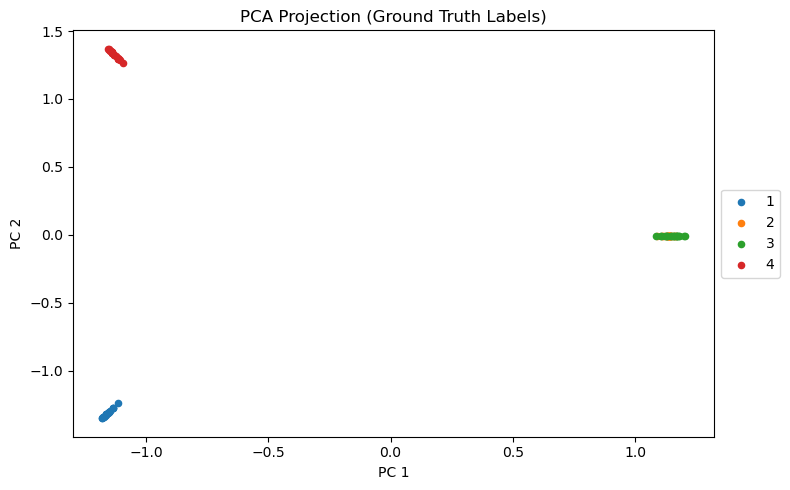

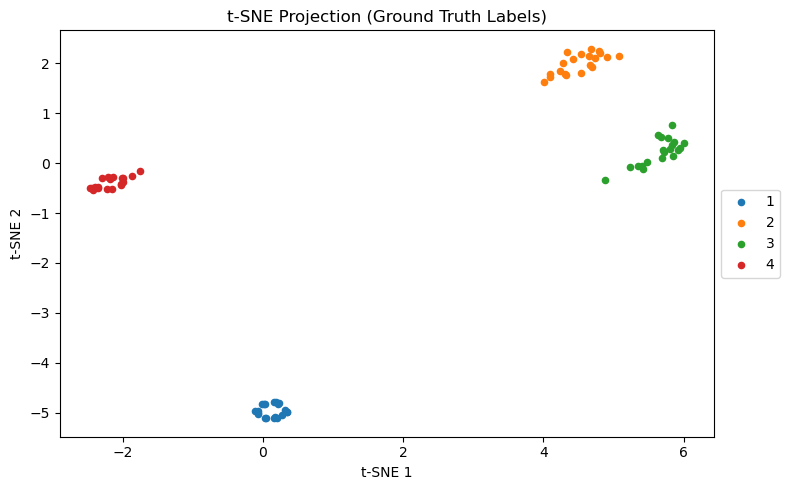

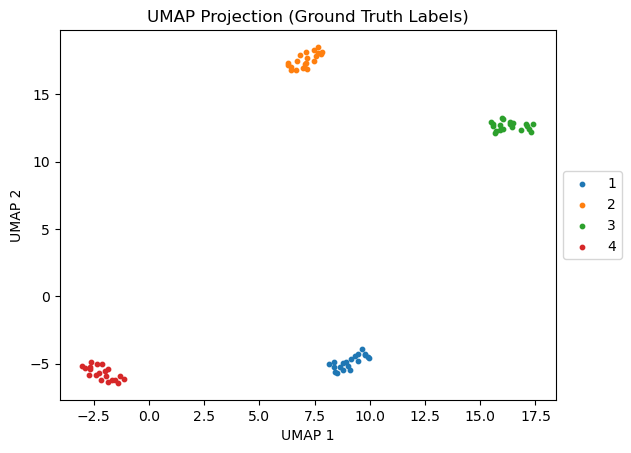

In [153]:
# --- PCA PLOT WITH TRUE LABELS ---
plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    # Create a boolean mask for the rows belonging to this group
    mask = (numeric_labels == group_label)
    plt.scatter(
        pcs[mask, 0],   # PCA dimension 1
        pcs[mask, 1],   # PCA dimension 2
        label=group_label,
        s=20
    )
plt.title('PCA Projection (Ground Truth Labels)')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

# --- TSNE PLOT WITH TRUE LABELS ---
plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    mask = (numeric_labels == group_label)
    plt.scatter(
        embedding[mask, 0],  # t-SNE dimension 1
        embedding[mask, 1],  # t-SNE dimension 2
        label=group_label,
        s=20
    )
plt.title('t-SNE Projection (Ground Truth Labels)')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

for group_label in np.unique(numeric_labels):
    mask = (numeric_labels == group_label)
    plt.scatter(
        embedding_umap[mask, 0],
        embedding_umap[mask, 1],
        label=group_label,
        marker='o',
        s=10
    )
plt.title('UMAP Projection (Ground Truth Labels)')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [154]:
from sklearn.metrics import jaccard_score
from sklearn.preprocessing import LabelEncoder
def calculate_jaccard_similarity(cluster_labels, annotations):
    # Encode labels as integers
    le = LabelEncoder()
    cluster_labels_encoded = le.fit_transform(cluster_labels)
    label1 = le.classes_
    annotations_encoded = le.fit_transform(annotations)
    label2 = le.classes_

    # Calculate Jaccard similarity matrix
    n_label1 = len(label1)
    n_label2 = len(label2)
    jaccard_matrix = np.zeros((n_label1, n_label2))

    for i in range(n_label1):
        for j in range(n_label2):
            jaccard_matrix[i, j] = jaccard_score(cluster_labels_encoded == i, annotations_encoded == j)

    return jaccard_matrix, label1, label2

def plot_heatmap(similarity_matrix, labels1, labels2):
    plt.figure(figsize=(10, 8))
    plt.imshow(similarity_matrix, cmap='viridis', aspect='auto')
    plt.colorbar(label='Jaccard Similarity')
    plt.xticks(range(len(labels1)), labels1, rotation=45, ha='right')
    plt.yticks(range(len(labels2)), labels2)
    plt.xlabel('Annotations')
    plt.ylabel('Cluster Labels')
    plt.tight_layout()
    plt.show()

def save_heatmap(similarity_matrix, labels1, labels2, title):
    plt.figure(figsize=(10, 8))
    plt.imshow(similarity_matrix, cmap='viridis', aspect='auto')
    plt.colorbar(label='Jaccard Similarity')
    plt.xticks(range(len(labels1)), labels1, rotation=45, ha='right')
    plt.yticks(range(len(labels2)), labels2)
    plt.xlabel('Annotations')
    plt.ylabel('Cluster Labels')
    plt.tight_layout()
    plt.savefig(title, format="pdf", bbox_inches="tight")

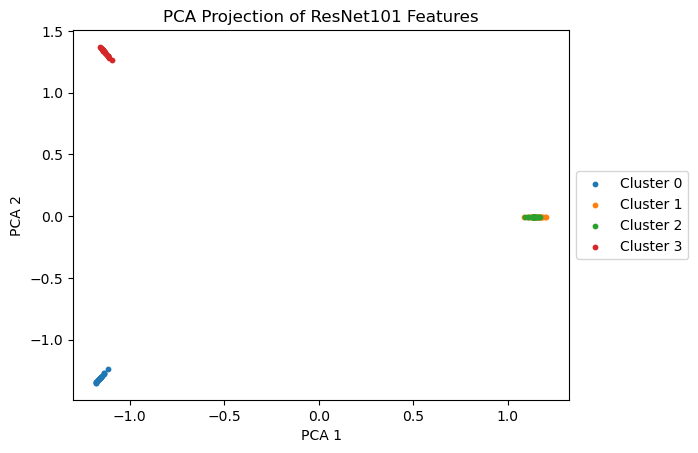

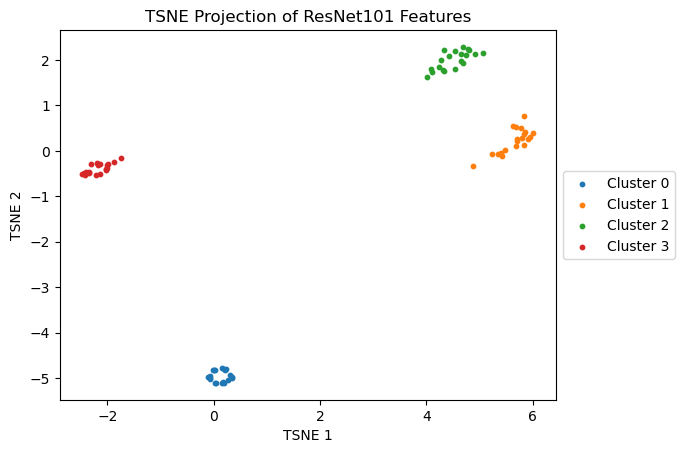

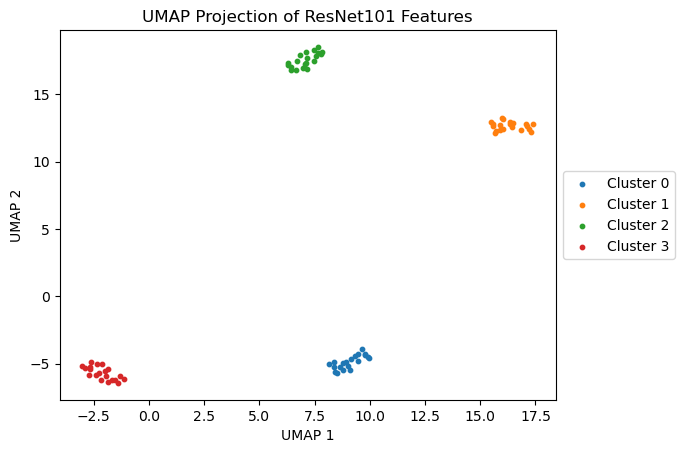

In [155]:
#Construct a k-Nearest Neighbors graph
knn_graph = kneighbors_graph(pcs, n_neighbors=18, metric='cosine', mode='connectivity', include_self=True)
#Convert the sparse matrix to a graph
G = nx.from_scipy_sparse_array(knn_graph)
# Perform Louvain clustering
partition = cl.best_partition(G)
#Compute the modularity of a partition of a graph
cl.modularity(partition, G)
#Extract cluster labels
cluster_labels = np.array(list(partition.values()))
unique_labels_2 = set(cluster_labels)


for label in unique_labels_2:
    plt.scatter(
        pcs[cluster_labels == label, 0],  # PCA 1 values for this cluster
        pcs[cluster_labels == label, 1],  # PCA 2 values for this cluster
        label=f'Cluster {label}',  # Label for legend
        marker='o', 
        s=10
    )
plt.title('PCA Projection of ResNet101 Features')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

for label in unique_labels_2:
    plt.scatter(
        embedding[cluster_labels == label, 0],  # PCA 1 values for this cluster
        embedding[cluster_labels == label, 1],  # PCA 2 values for this cluster
        label=f'Cluster {label}',  # Label for legend
        marker='o', 
        s=10
    )
plt.title('TSNE Projection of ResNet101 Features')
plt.xlabel('TSNE 1')
plt.ylabel('TSNE 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


for label in unique_labels_2:
    plt.scatter(
        embedding_umap[cluster_labels == label, 0],  # PCA 1 values for this cluster
        embedding_umap[cluster_labels == label, 1],  # PCA 2 values for this cluster
        label=f'Cluster {label}',  # Label for legend
        marker='o', 
        s=10
    )
plt.title('UMAP Projection of ResNet101 Features')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

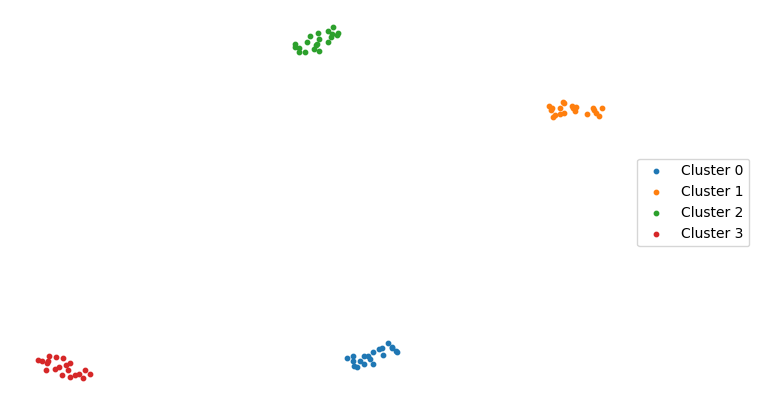

In [156]:
plt.figure(figsize=(8, 5))
for label in unique_labels_2:
    plt.scatter(
        embedding_umap[cluster_labels == label, 0],  # PCA 1 values for this cluster
        embedding_umap[cluster_labels == label, 1],  # PCA 2 values for this cluster
        label=f'Cluster {label}',  # Label for legend
        marker='o', 
        s=10
    )
# Remove the x and y axis, ticks, and labels
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)

plt.gca().get_xaxis().set_ticks([])
plt.gca().get_yaxis().set_ticks([])

# Remove the axis labels and title
plt.xlabel('')
plt.ylabel('')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
#plt.savefig("umap_simulated_nuc_peri_STARIT.pdf", format="pdf", bbox_inches="tight")
plt.show()

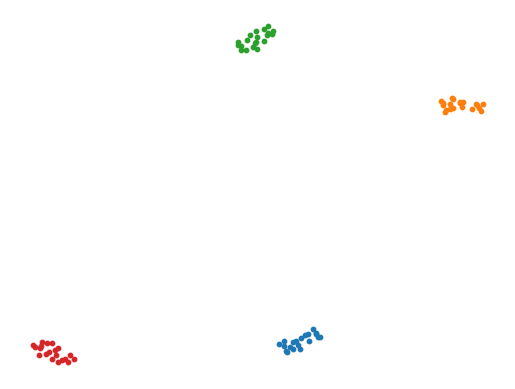

In [157]:
for label in unique_labels_2:
    plt.scatter(
        embedding_umap[cluster_labels == label, 0],  # PCA 1 values for this cluster
        embedding_umap[cluster_labels == label, 1],  # PCA 2 values for this cluster
        label=f'Cluster {label}',  # Label for legend
        marker='o', 
        s=10
    )
# Remove the x and y axis, ticks, and labels
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)

plt.gca().get_xaxis().set_ticks([])
plt.gca().get_yaxis().set_ticks([])

# Remove the axis labels and title
plt.xlabel('')
plt.ylabel('')
plt.title('')
plt.savefig("umap_simulated_nuc_peri_STARIT.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [158]:
for label in unique_labels_2:
    count = np.sum(cluster_labels == label)
    print(f"Cluster {label}: {count} data points")

Cluster 0: 20 data points
Cluster 1: 20 data points
Cluster 2: 20 data points
Cluster 3: 20 data points


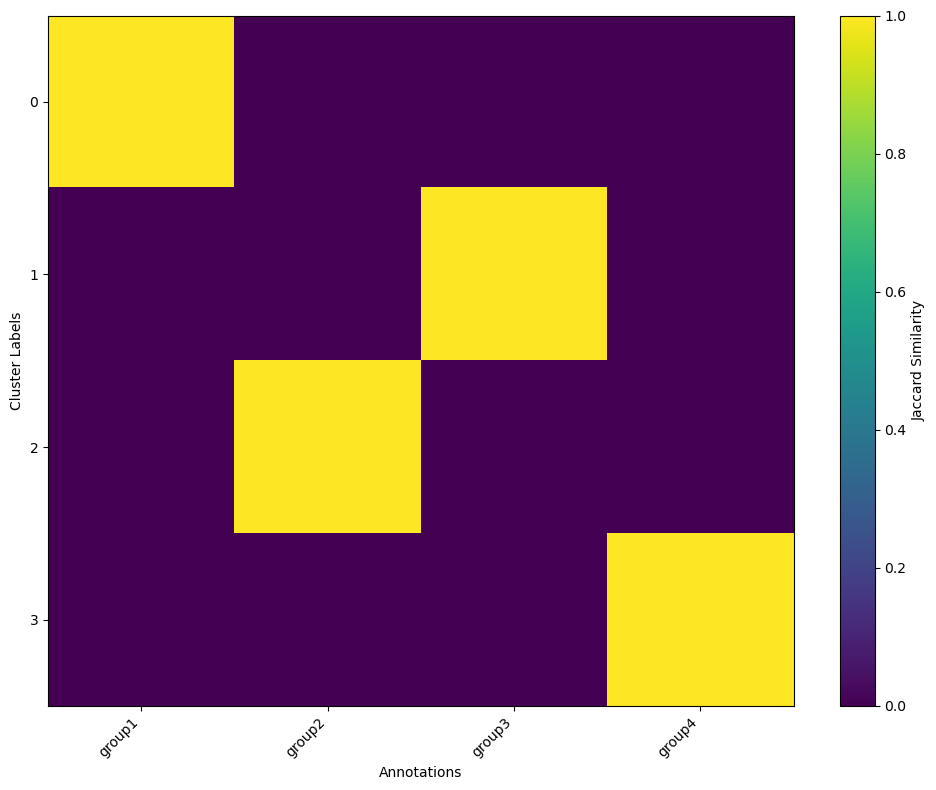

In [159]:
jaccard_matrix, labels1, labels2 = calculate_jaccard_similarity(cluster_labels, np.array(annotations))
plot_heatmap(jaccard_matrix, labels2, labels1)

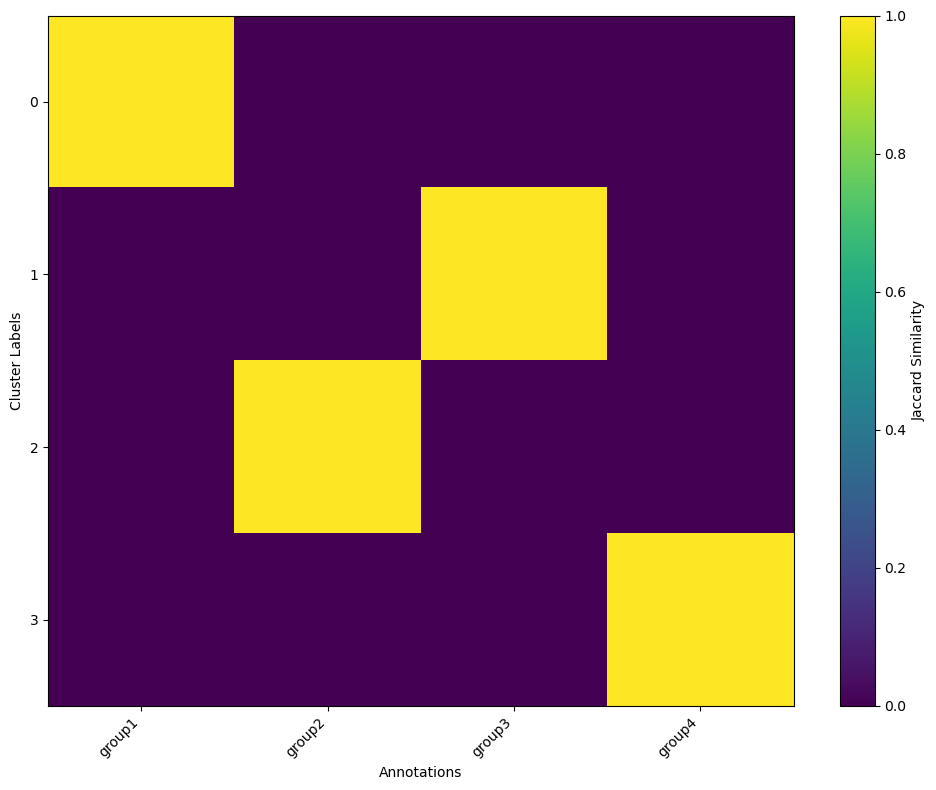

In [160]:
save_heatmap(jaccard_matrix, labels2, labels1, "jaccard_simulated_nuc_peri_STARIT.pdf")

In [196]:
features_stack.shape

(80, 6144)

## Heatmap Visualization

In [187]:
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import linkage, dendrogram
# Transpose and scale features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features_stack)
features_df = pd.DataFrame(features_scaled.T)

# Label each feature by gene and feature number
feature_labels = []
gene_labels = []
for i in range(3):  # 3 genes
    for j in range(2048):
        feature_labels.append(f"gene{i+1}_f{j}")
        gene_labels.append(f"gene{i+1}")
features_df.index = feature_labels

# Hierarchical clustering within each gene
clustered_features = []
row_dendrograms = []
gene_label_positions = []

for i in range(3):
    start = i * 2048
    end = (i + 1) * 2048
    subset = features_df.iloc[start:end, :]

    linkage_rows = linkage(subset, method='ward', metric='euclidean')
    dendro = dendrogram(linkage_rows, no_plot=True)
    row_order = dendro['leaves']
    reordered_subset = subset.iloc[row_order, :]
    clustered_features.append(reordered_subset)

    # Track where to place the gene label
    gene_label_positions.append(len(pd.concat(clustered_features)) - 1024)

# Combine reordered feature blocks
heatmap_df = pd.concat(clustered_features, axis=0)

# Assign column colors for clusters
lut = {0: "#66c2a5", 1: "#fc8d62", 2: "#8da0cb", 3: "#e78ac3"}
col_colors = pd.Series(cluster_labels).map(lut)

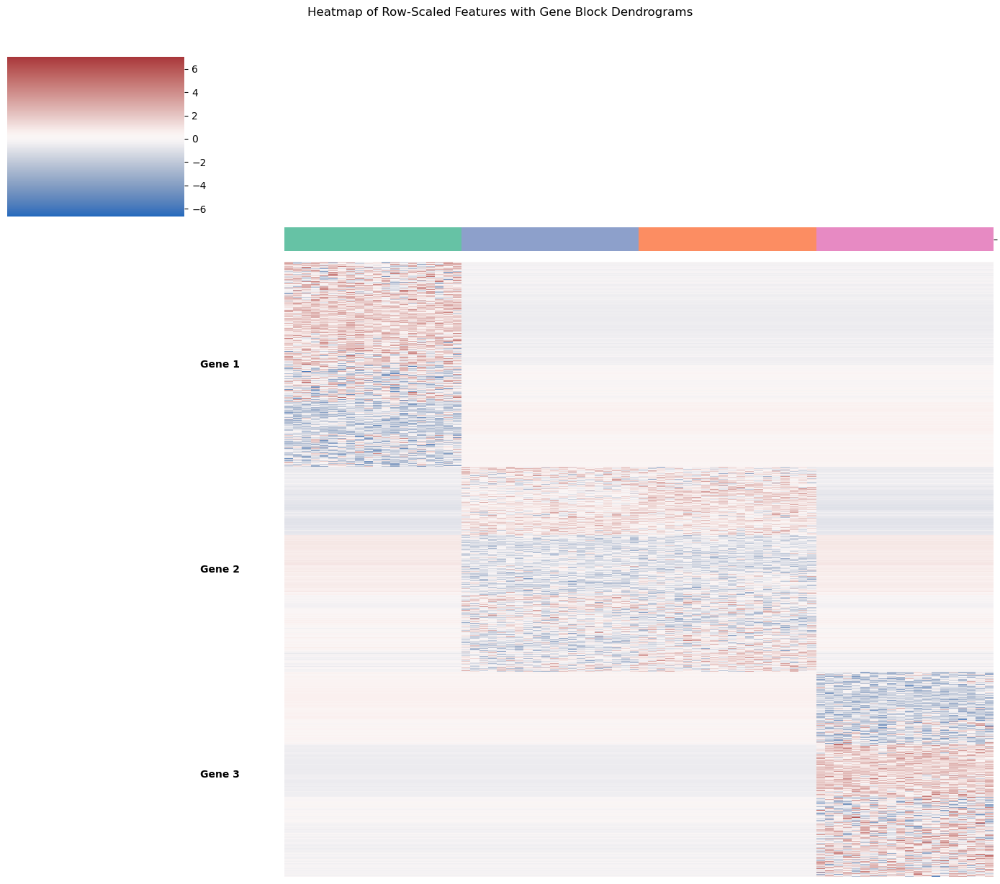

In [188]:
# Plot heatmap
g = sns.clustermap(
    heatmap_df,
    row_cluster=False,
    col_cluster=False,
    col_colors=col_colors,
    cmap="vlag",
    xticklabels=False,
    yticklabels=False,
    figsize=(14, 12)
)

# Add horizontal gene labels
ax = g.ax_heatmap
for idx, pos in enumerate(gene_label_positions):
    ax.text(-5, pos, f"Gene {idx+1}", va='center', ha='right', fontsize=10, rotation=0, fontweight='bold')

plt.suptitle("Heatmap of Row-Scaled Features with Gene Block Dendrograms", y=1.02)
plt.tight_layout()
plt.show()

/tmp/ipykernel_1985666/1294649183.py:50: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


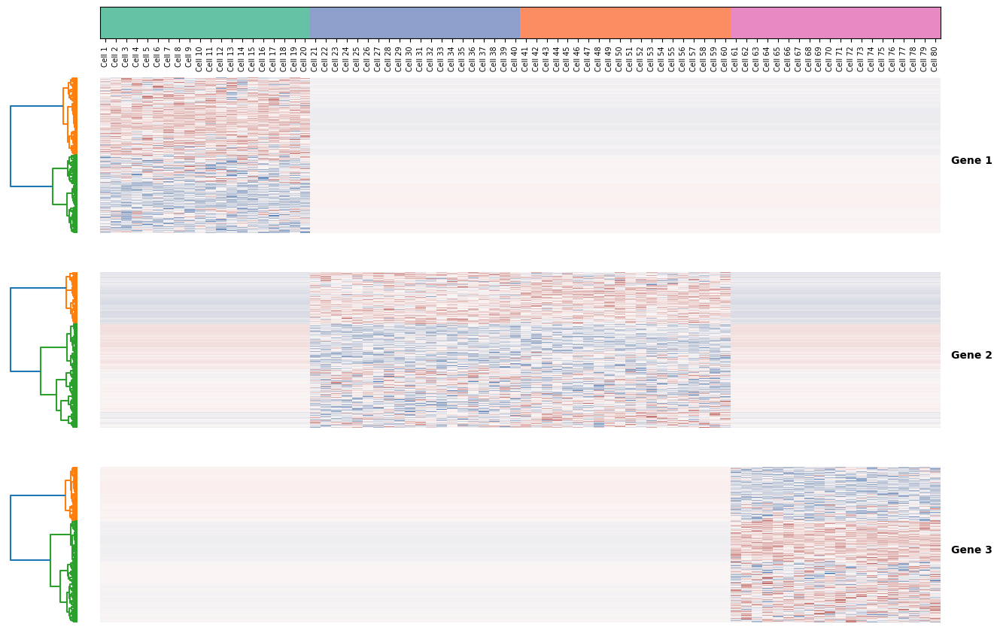

In [ ]:
from matplotlib.colors import to_rgb
from matplotlib.gridspec import GridSpec

# Convert hex colors to RGB format for imshow
col_colors_rgb = np.array([to_rgb(c) for c in col_colors])

# Prepare figure manually for full customization
fig = plt.figure(figsize=(16, 14))
gs = GridSpec(5, 2, width_ratios=[1, 12], height_ratios=[0.2, 1, 1, 1, 1], hspace=0.3, wspace=0.05)

# Plot top colorbar for column clusters
ax_colorbar = fig.add_subplot(gs[0, 1])
ax_colorbar.imshow([col_colors_rgb], aspect='auto')
ax_colorbar.set_xticks(np.arange(len(col_colors)))
ax_colorbar.set_xticklabels([f"Cell {i+1}" for i in range(len(col_colors))], rotation=90, fontsize=7)
ax_colorbar.set_yticks([])
#ax_colorbar.set_title("Cell Clusters", fontsize=10)

# Plot each gene block with dendrogram and heatmap
for i in range(3):
    start = i * 2048
    end = (i + 1) * 2048
    subset = features_df.iloc[start:end, :]

    # Dendrogram
    linkage_rows = linkage(subset, method='ward', metric='euclidean')
    dendro_ax = fig.add_subplot(gs[i+1, 0])
    dendro = dendrogram(linkage_rows, orientation='left', no_labels=True, ax=dendro_ax, color_threshold=None)
    dendro_ax.invert_yaxis()
    dendro_ax.axis('off')

    # Reorder heatmap based on dendrogram
    row_order = dendro['leaves']
    reordered_subset = subset.iloc[row_order, :]

    heatmap_ax = fig.add_subplot(gs[i+1, 1])
    sns.heatmap(
        reordered_subset,
        ax=heatmap_ax,
        #cmap="viridis",
        cmap="vlag",
        cbar=False,
        xticklabels=False,
        yticklabels=False
    )
    heatmap_ax.set_ylabel(f"Gene {i+1}", rotation=0, labelpad=30, fontsize=10, weight='bold')
    heatmap_ax.yaxis.set_label_position("right")

#plt.suptitle("Heatmap of Scaled Features\nwith Gene Block Dendrograms and Cell Labels", y=0.94, fontsize=14)
plt.tight_layout()
#plt.savefig("tsne_simulated_nuc_peri_noise_weighted_heatmap.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [199]:
import plotly.graph_objects as go

# Create the heatmap using go.Heatmap
fig = go.Figure(data=go.Heatmap(
    z=heatmap_df.values,
    x=[f"Cell {i+1}" for i in range(heatmap_df.shape[1])],
    y=heatmap_df.index.tolist(),
    colorscale="RdBu",
    colorbar=dict(title="Z-score"),
    hovertemplate="Feature: %{y}<br>Cell: %{x}<br>Z-score: %{z:.2f}<extra></extra>"
))

# Layout settings
fig.update_layout(
    title="Heatmap of Scaled Features for Simulated Nuclear & Perinuclear Data (Clustered Within Genes)",
    xaxis_title="Cells",
    yaxis_title="Features (by Gene)",
    height=1000,
    width=1200,
    yaxis=dict(autorange="reversed")
)

fig.show()


## Generate Count Matrices

In [ ]:
def generate_count_matrix(base_output_dir, num_groups=4, num_cells=20, num_genes=3):
    data = []
    cell_ids = []
    cell_index = 1  # Start from cell1

    for group in range(1, num_groups + 1):
        for cell in range(1, num_cells + 1):
            expression = [0.0] * num_genes  # [gene1, gene2, gene3]
            if group == 1:
                expression[0] = 50  # gene1
            elif group == 2 or group == 3:
                expression[1] = 50  # gene2
            elif group == 4:
                expression[2] = 50  # gene3

            cell_ids.append(f'cell{cell_index}')
            data.append(expression)
            cell_index += 1

    df = pd.DataFrame(data, columns=[f'gene{i+1}' for i in range(num_genes)], index=cell_ids)
    df.to_csv(os.path.join(base_output_dir, 'count_matrix.csv'))
    print(f'count_matrix.csv saved to {base_output_dir}')

# Example usage
base_output_dir = 'data/simulation_caleb_nuclear_peri/'
generate_count_matrix(base_output_dir)

count_matrix.csv saved to data/simulation_caleb_nuclear_peri/


In [ ]:
def generate_count_matrix_cp1(base_output_dir, num_groups=4, num_cells=20, num_genes=3):
    data = []
    cell_ids = []
    cell_index = 1  # Start from cell1

    for group in range(1, num_groups + 1):
        for cell in range(1, num_cells + 1):
            expression = [0.0] * num_genes  # [gene1, gene2, gene3]
            if group == 1:
                expression[0] = 1  # gene1
            elif group == 2 or group == 3:
                expression[1] = 1  # gene2
            elif group == 4:
                expression[2] = 1  # gene3

            cell_ids.append(f'cell{cell_index}')
            data.append(expression)
            cell_index += 1

    df = pd.DataFrame(data, columns=[f'gene{i+1}' for i in range(num_genes)], index=cell_ids)
    df.to_csv(os.path.join(base_output_dir, 'cp1_count_matrix.csv'))
    print(f'cp1_count_matrix.csv saved to {base_output_dir}')

# Example usage
base_output_dir = 'data/simulation_caleb_nuclear_peri/'
generate_count_matrix_cp1(base_output_dir)

cp1_count_matrix.csv saved to data/simulation_caleb_nuclear_peri/


## Just Gene Counts

## Raw Counts

In [ ]:
count_matrix = pd.read_csv("/home/deev/t-simcne/CAP-CNN/data/simulation_caleb_nuclear_peri/count_matrix.csv", index_col=0)
#Perform PCA
pca = PCA(n_components=3, random_state=22)
pca.fit(count_matrix)
pcs = pca.transform(count_matrix)

In [ ]:
#t-SNE dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
embedding = tsne.fit_transform(pcs)

In [ ]:
reducer = umap.UMAP(n_neighbors=20, min_dist=0.5, random_state=42)
embedding_umap = reducer.fit_transform(pcs)

/home/deev/anaconda3/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/deev/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


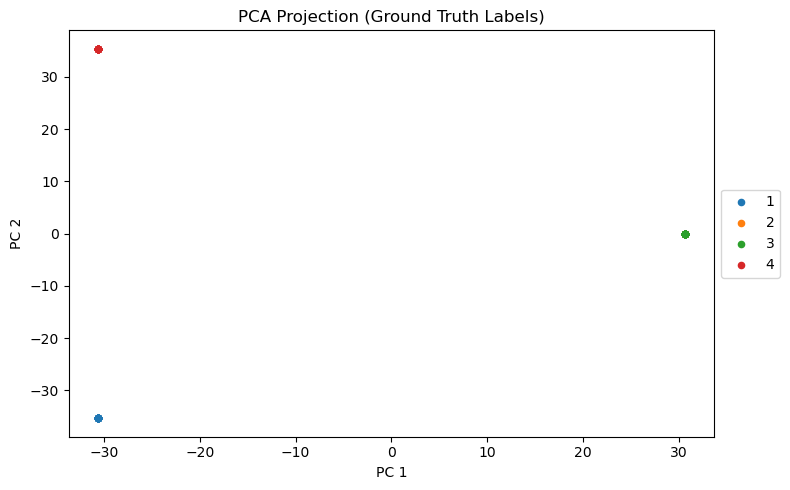

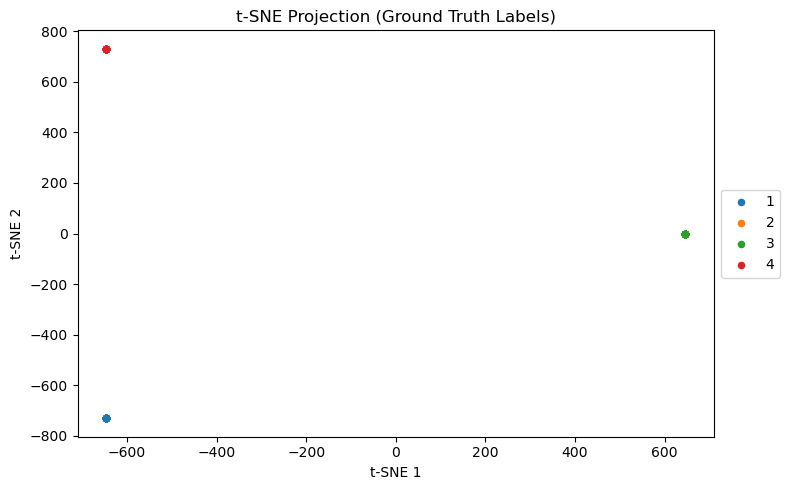

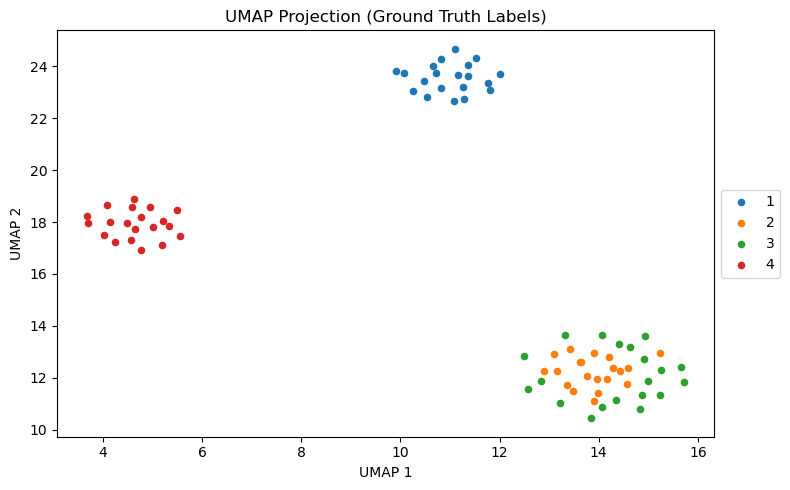

In [ ]:
# --- PCA PLOT WITH TRUE LABELS ---
plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    # Create a boolean mask for the rows belonging to this group
    mask = (numeric_labels == group_label)
    plt.scatter(
        pcs[mask, 0],   # PCA dimension 1
        pcs[mask, 1],   # PCA dimension 2
        label=group_label,
        s=20
    )
plt.title('PCA Projection (Ground Truth Labels)')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

# --- TSNE PLOT WITH TRUE LABELS ---
plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    mask = (numeric_labels == group_label)
    plt.scatter(
        embedding[mask, 0],  # t-SNE dimension 1
        embedding[mask, 1],  # t-SNE dimension 2
        label=group_label,
        s=20
    )
plt.title('t-SNE Projection (Ground Truth Labels)')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    mask = (numeric_labels == group_label)
    plt.scatter(
        embedding_umap[mask, 0],  # t-SNE dimension 1
        embedding_umap[mask, 1],  # t-SNE dimension 2
        label=group_label,
        s=20
    )
plt.title('UMAP Projection (Ground Truth Labels)')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

In [ ]:
for label in np.unique(numeric_labels):
    count = np.sum(numeric_labels == label)
    print(f"Cluster {label}: {count} data points")

Cluster 1: 20 data points
Cluster 2: 20 data points
Cluster 3: 20 data points
Cluster 4: 20 data points


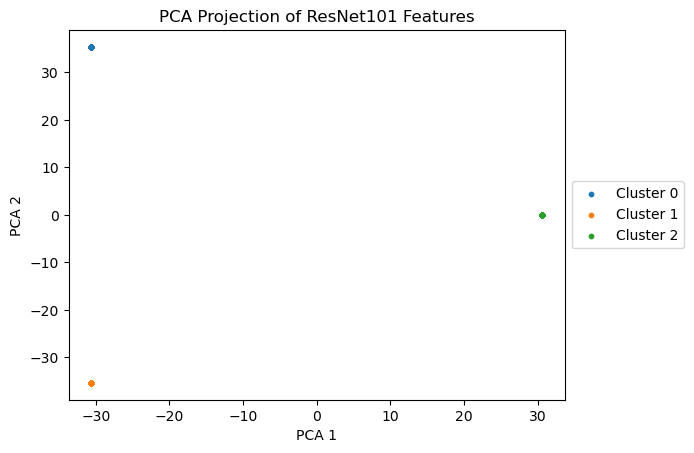

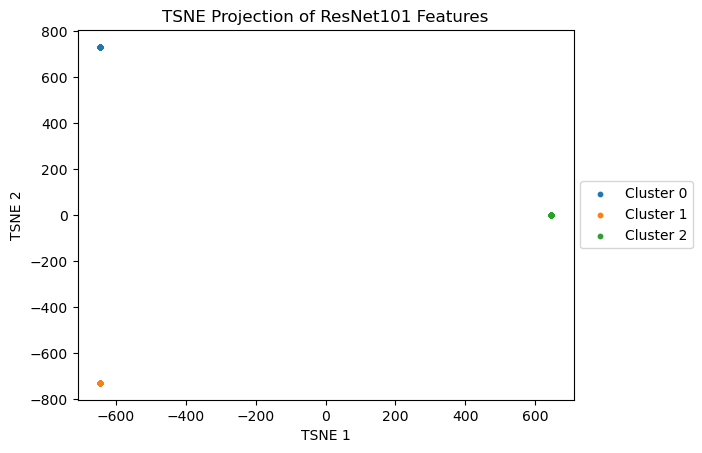

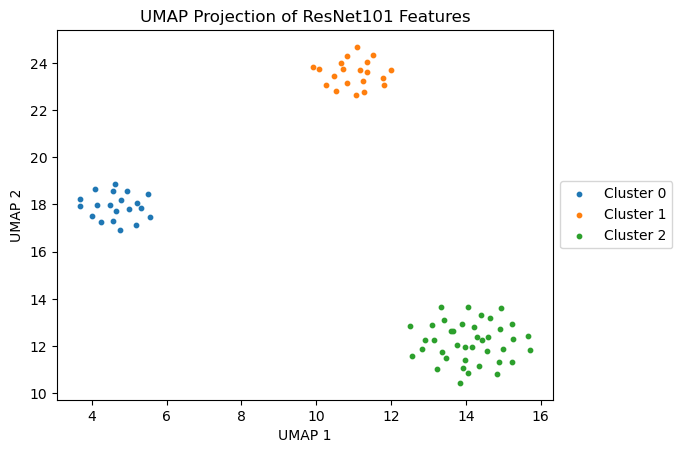

In [ ]:
#Construct a k-Nearest Neighbors graph
knn_graph = kneighbors_graph(pcs, n_neighbors=20, metric='cosine', mode='connectivity', include_self=True)
#Convert the sparse matrix to a graph
G = nx.from_scipy_sparse_array(knn_graph)
# Perform Louvain clustering
partition = cl.best_partition(G)
#Compute the modularity of a partition of a graph
cl.modularity(partition, G)
#Extract cluster labels
cluster_labels = np.array(list(partition.values()))
unique_labels_2 = set(cluster_labels)


for label in unique_labels_2:
    plt.scatter(
        pcs[cluster_labels == label, 0],  # PCA 1 values for this cluster
        pcs[cluster_labels == label, 1],  # PCA 2 values for this cluster
        label=f'Cluster {label}',  # Label for legend
        marker='o', 
        s=10
    )
plt.title('PCA Projection of ResNet101 Features')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

for label in unique_labels_2:
    plt.scatter(
        embedding[cluster_labels == label, 0],  # PCA 1 values for this cluster
        embedding[cluster_labels == label, 1],  # PCA 2 values for this cluster
        label=f'Cluster {label}',  # Label for legend
        marker='o', 
        s=10
    )
plt.title('TSNE Projection of ResNet101 Features')
plt.xlabel('TSNE 1')
plt.ylabel('TSNE 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

for label in unique_labels_2:
    plt.scatter(
        embedding_umap[cluster_labels == label, 0],  # PCA 1 values for this cluster
        embedding_umap[cluster_labels == label, 1],  # PCA 2 values for this cluster
        label=f'Cluster {label}',  # Label for legend
        marker='o', 
        s=10
    )
plt.title('UMAP Projection of ResNet101 Features')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

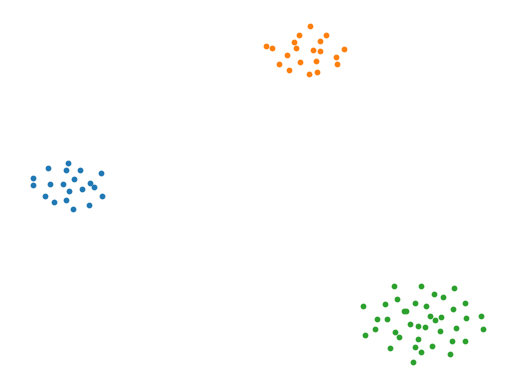

In [ ]:
for label in unique_labels_2:
    plt.scatter(
        embedding_umap[cluster_labels == label, 0],  # PCA 1 values for this cluster
        embedding_umap[cluster_labels == label, 1],  # PCA 2 values for this cluster
        label=f'Cluster {label}',  # Label for legend
        marker='o', 
        s=10
    )
# Remove the x and y axis, ticks, and labels
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)

plt.gca().get_xaxis().set_ticks([])
plt.gca().get_yaxis().set_ticks([])

# Remove the axis labels and title
plt.xlabel('')
plt.ylabel('')
plt.title('')
plt.savefig("umap_simulated_nuc_peri_gene_counts.pdf", format="pdf", bbox_inches="tight")
plt.show()

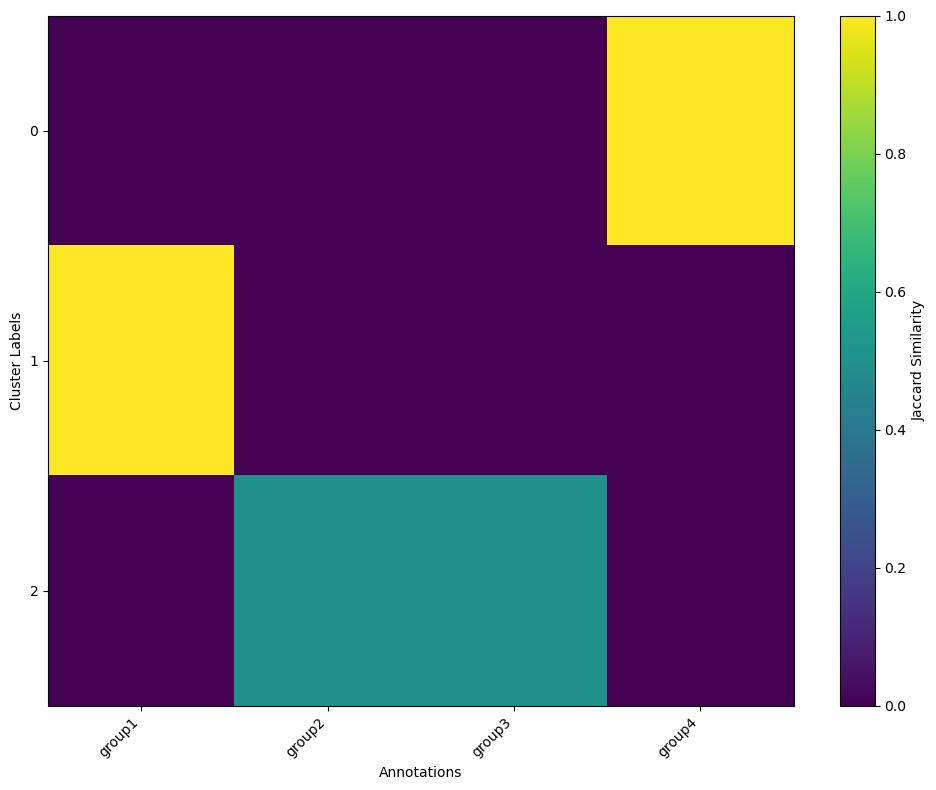

In [ ]:
jaccard_matrix, labels1, labels2 = calculate_jaccard_similarity(cluster_labels, np.array(annotations))
plot_heatmap(jaccard_matrix, labels2, labels1)

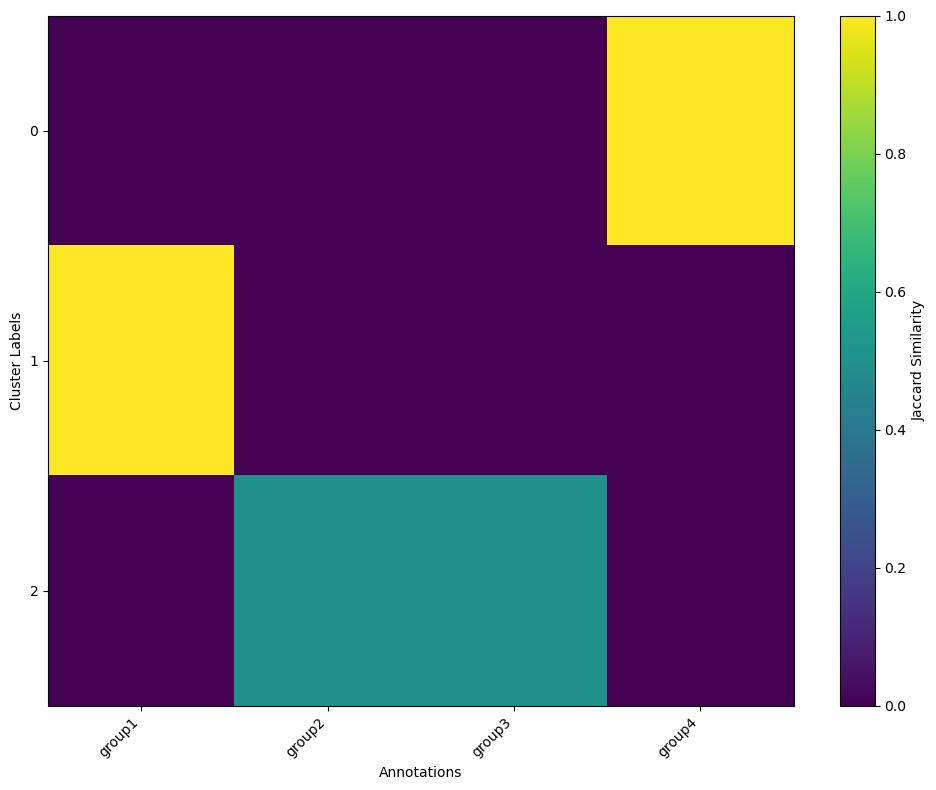

In [ ]:
save_heatmap(jaccard_matrix, labels2, labels1, "jaccard_simulated_nuc_peri_gene_counts.pdf")

## CP1 Scaled

In [ ]:
count_matrix = pd.read_csv("/home/deev/t-simcne/CAP-CNN/data/simulation_caleb_nuclear_peri/cp1_count_matrix.csv", index_col=0)
#Perform PCA
pca = PCA(n_components=3, random_state=22)
pca.fit(count_matrix)
pcs = pca.transform(count_matrix)

In [ ]:
#t-SNE dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
embedding = tsne.fit_transform(pcs)

In [ ]:
reducer = umap.UMAP(n_neighbors=20, min_dist=0.5, random_state=42)
embedding_umap = reducer.fit_transform(pcs)

/home/deev/anaconda3/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/deev/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


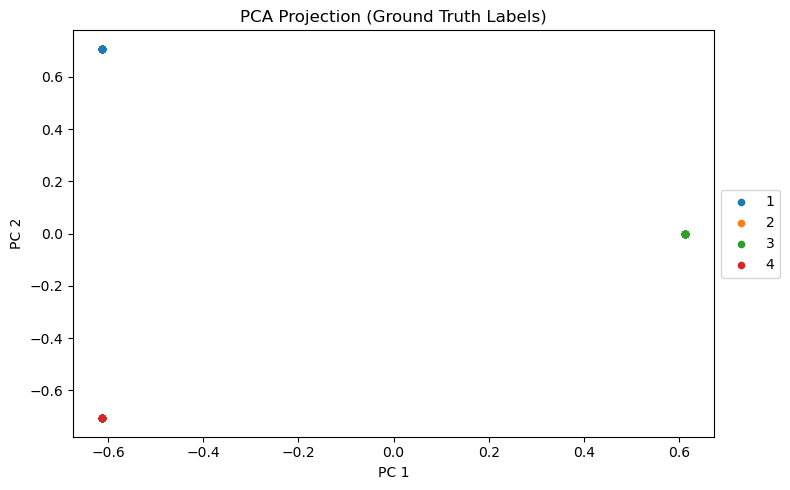

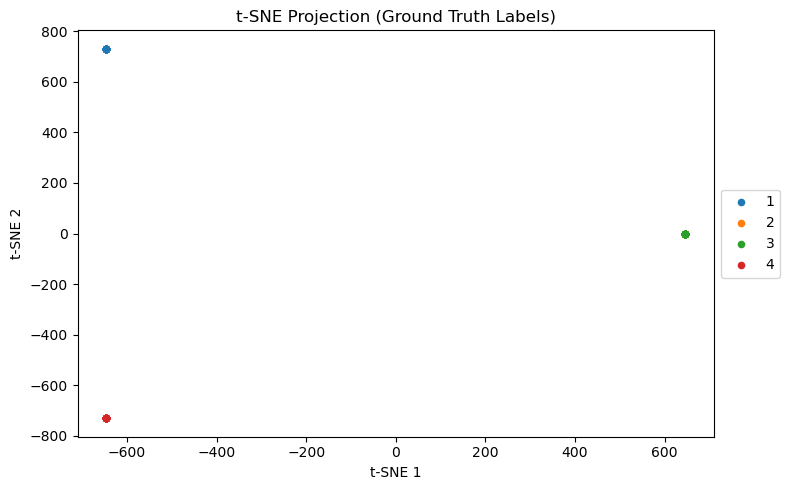

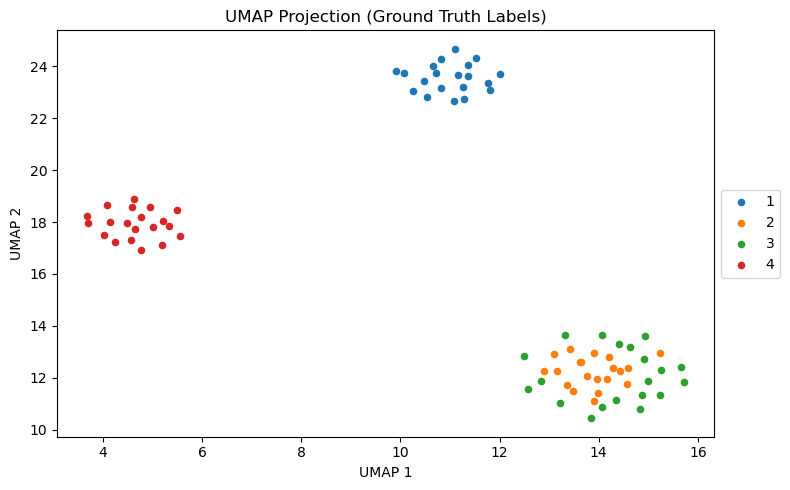

In [ ]:
# --- PCA PLOT WITH TRUE LABELS ---
plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    # Create a boolean mask for the rows belonging to this group
    mask = (numeric_labels == group_label)
    plt.scatter(
        pcs[mask, 0],   # PCA dimension 1
        pcs[mask, 1],   # PCA dimension 2
        label=group_label,
        s=20
    )
plt.title('PCA Projection (Ground Truth Labels)')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

# --- TSNE PLOT WITH TRUE LABELS ---
plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    mask = (numeric_labels == group_label)
    plt.scatter(
        embedding[mask, 0],  # t-SNE dimension 1
        embedding[mask, 1],  # t-SNE dimension 2
        label=group_label,
        s=20
    )
plt.title('t-SNE Projection (Ground Truth Labels)')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

# --- TSNE PLOT WITH TRUE LABELS ---
plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    mask = (numeric_labels == group_label)
    plt.scatter(
        embedding_umap[mask, 0],  # t-SNE dimension 1
        embedding_umap[mask, 1],  # t-SNE dimension 2
        label=group_label,
        s=20
    )
plt.title('UMAP Projection (Ground Truth Labels)')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

In [ ]:
for label in np.unique(numeric_labels):
    count = np.sum(numeric_labels == label)
    print(f"Cluster {label}: {count} data points")

Cluster 1: 20 data points
Cluster 2: 20 data points
Cluster 3: 20 data points
Cluster 4: 20 data points


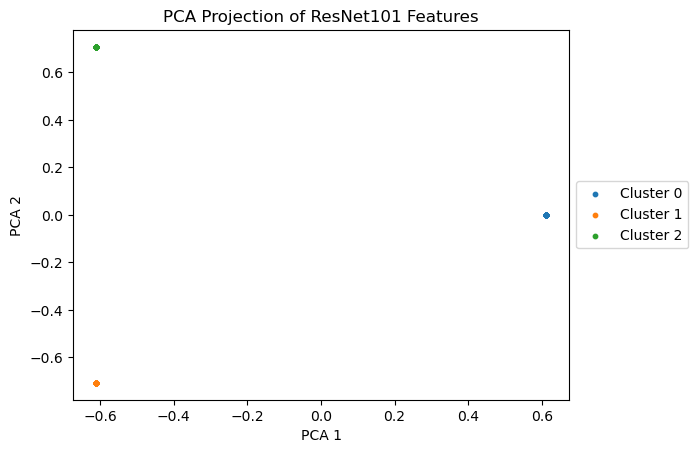

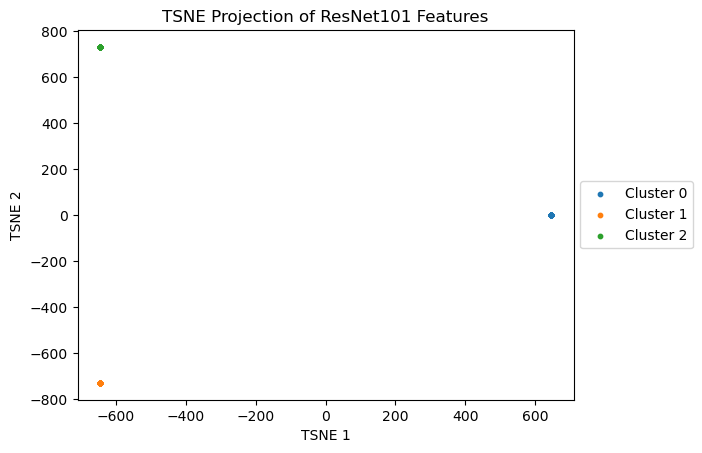

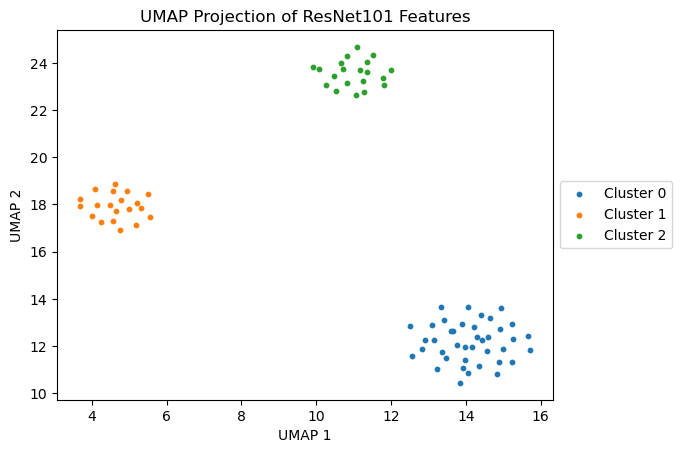

In [ ]:
#Construct a k-Nearest Neighbors graph
knn_graph = kneighbors_graph(pcs, n_neighbors=20, metric='cosine', mode='connectivity', include_self=True)
#Convert the sparse matrix to a graph
G = nx.from_scipy_sparse_array(knn_graph)
# Perform Louvain clustering
partition = cl.best_partition(G)
#Compute the modularity of a partition of a graph
cl.modularity(partition, G)
#Extract cluster labels
cluster_labels = np.array(list(partition.values()))
unique_labels_2 = set(cluster_labels)


for label in unique_labels_2:
    plt.scatter(
        pcs[cluster_labels == label, 0],  # PCA 1 values for this cluster
        pcs[cluster_labels == label, 1],  # PCA 2 values for this cluster
        label=f'Cluster {label}',  # Label for legend
        marker='o', 
        s=10
    )
plt.title('PCA Projection of ResNet101 Features')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

for label in unique_labels_2:
    plt.scatter(
        embedding[cluster_labels == label, 0],  # PCA 1 values for this cluster
        embedding[cluster_labels == label, 1],  # PCA 2 values for this cluster
        label=f'Cluster {label}',  # Label for legend
        marker='o', 
        s=10
    )
plt.title('TSNE Projection of ResNet101 Features')
plt.xlabel('TSNE 1')
plt.ylabel('TSNE 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

for label in unique_labels_2:
    plt.scatter(
        embedding_umap[cluster_labels == label, 0],  # PCA 1 values for this cluster
        embedding_umap[cluster_labels == label, 1],  # PCA 2 values for this cluster
        label=f'Cluster {label}',  # Label for legend
        marker='o', 
        s=10
    )
plt.title('UMAP Projection of ResNet101 Features')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

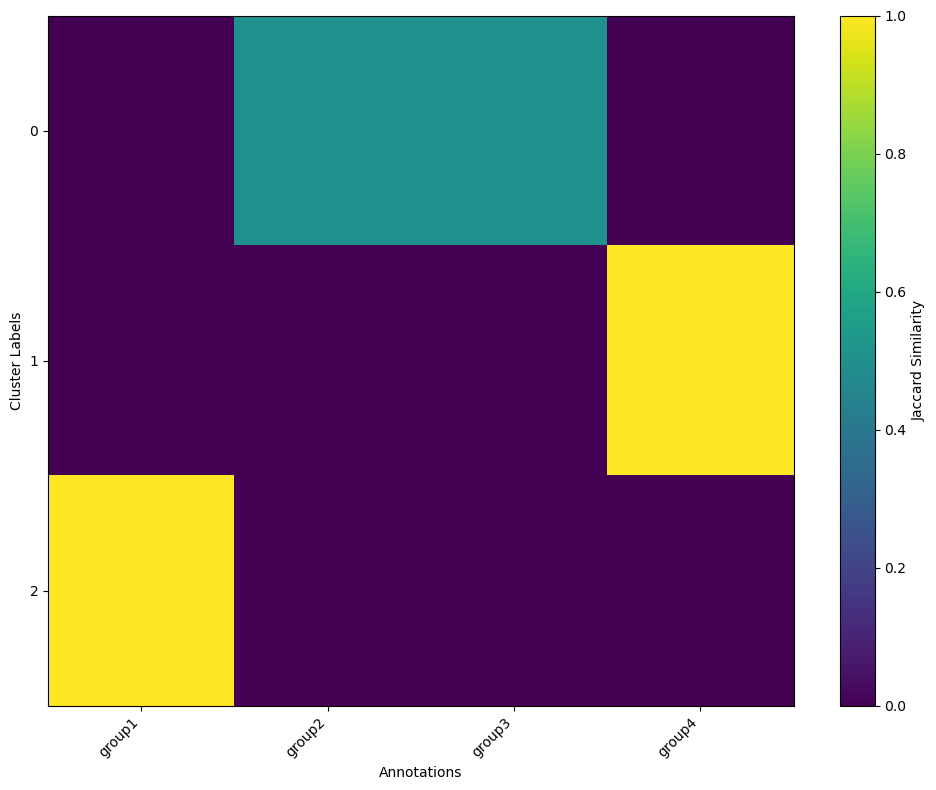

In [ ]:
jaccard_matrix, labels1, labels2 = calculate_jaccard_similarity(cluster_labels, np.array(annotations))
plot_heatmap(jaccard_matrix, labels2, labels1)

## Min-Max

In [ ]:
cm = '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb_nuclear_peri/count_matrix.csv'
counts_matrix = pd.read_csv(cm, index_col=0)
counts_matrix.index = counts_matrix.index.str.replace('_', '', regex=False)
counts_matrix.columns = counts_matrix.columns.str.replace('_', '', regex=False)
# Apply min-max scaling
def min_max_scaling(df):
    return (df - df.min()) / (df.max() - df.min())

scaled_counts_matrix = counts_matrix.copy()
scaled_counts_matrix = min_max_scaling(counts_matrix)
scaled_counts_matrix.to_csv('/home/deev/t-simcne/CAP-CNN/data/simulation_caleb_nuclear_peri/min-max_count_matrix.csv', index=True)

In [ ]:
count_matrix = pd.read_csv("/home/deev/t-simcne/CAP-CNN/data/simulation_caleb_nuclear_peri/min-max_count_matrix.csv", index_col=0)
#Perform PCA
pca = PCA(n_components=3, random_state=22)
pca.fit(count_matrix)
pcs = pca.transform(count_matrix)

In [ ]:
#t-SNE dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
embedding = tsne.fit_transform(pcs)

In [ ]:
reducer = umap.UMAP(n_neighbors=20, min_dist=0.5, random_state=42)
embedding_umap = reducer.fit_transform(pcs)

/home/deev/anaconda3/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/deev/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


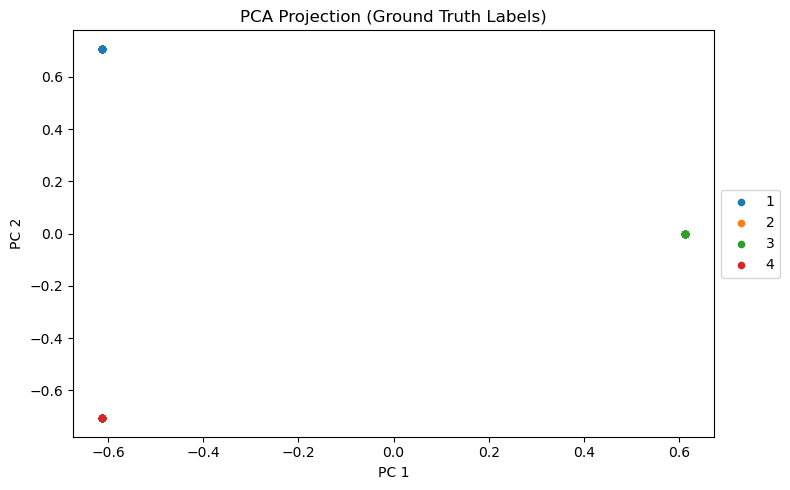

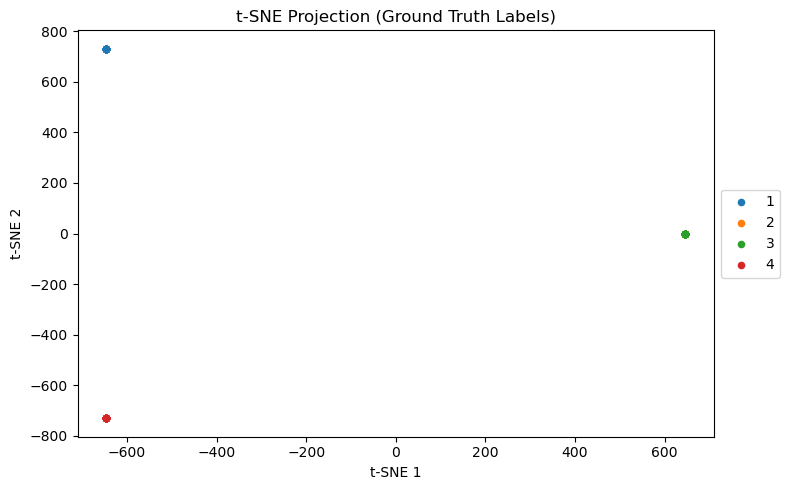

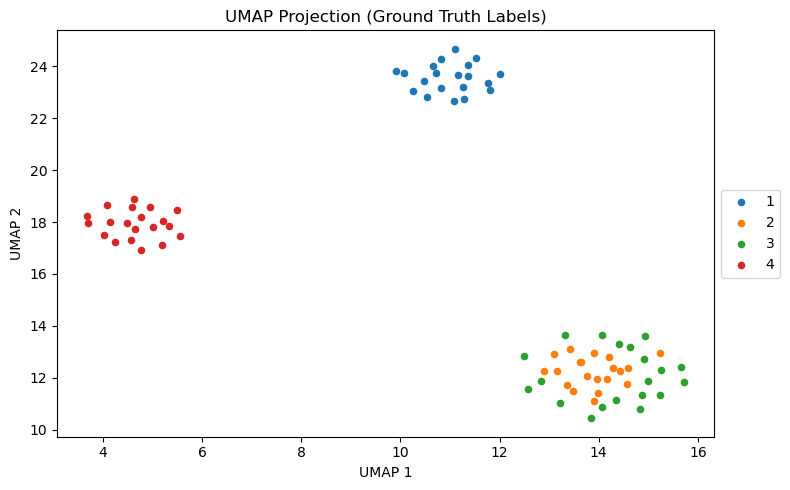

In [ ]:
# --- PCA PLOT WITH TRUE LABELS ---
plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    # Create a boolean mask for the rows belonging to this group
    mask = (numeric_labels == group_label)
    plt.scatter(
        pcs[mask, 0],   # PCA dimension 1
        pcs[mask, 1],   # PCA dimension 2
        label=group_label,
        s=20
    )
plt.title('PCA Projection (Ground Truth Labels)')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

# --- TSNE PLOT WITH TRUE LABELS ---
plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    mask = (numeric_labels == group_label)
    plt.scatter(
        embedding[mask, 0],  # t-SNE dimension 1
        embedding[mask, 1],  # t-SNE dimension 2
        label=group_label,
        s=20
    )
plt.title('t-SNE Projection (Ground Truth Labels)')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    mask = (numeric_labels == group_label)
    plt.scatter(
        embedding_umap[mask, 0],  # t-SNE dimension 1
        embedding_umap[mask, 1],  # t-SNE dimension 2
        label=group_label,
        s=20
    )
plt.title('UMAP Projection (Ground Truth Labels)')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

In [ ]:
for label in np.unique(numeric_labels):
    count = np.sum(numeric_labels == label)
    print(f"Cluster {label}: {count} data points")

Cluster 1: 20 data points
Cluster 2: 20 data points
Cluster 3: 20 data points
Cluster 4: 20 data points


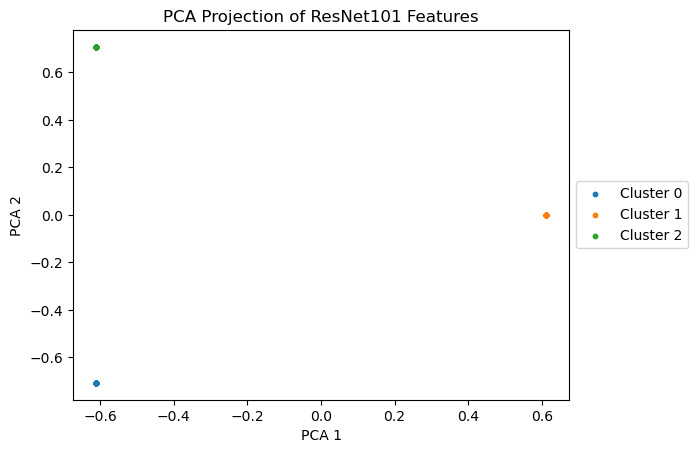

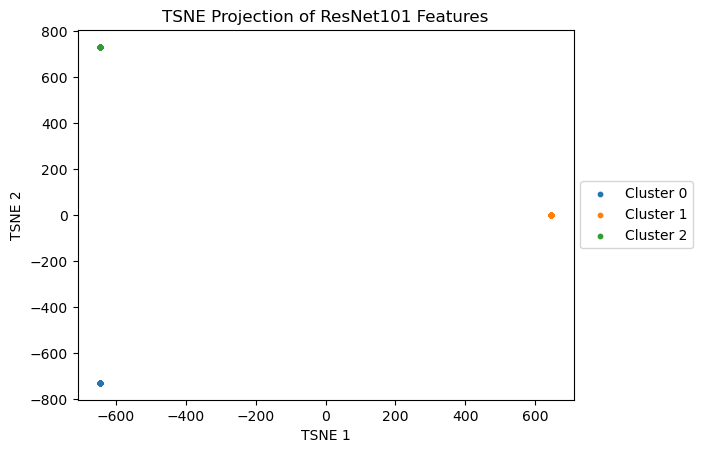

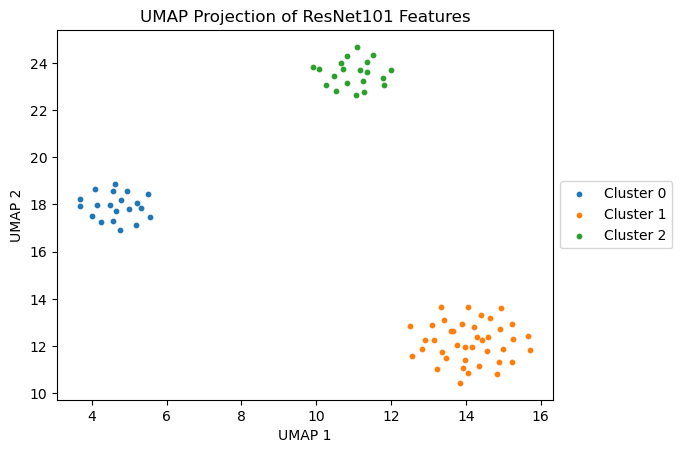

In [ ]:
#Construct a k-Nearest Neighbors graph
knn_graph = kneighbors_graph(pcs, n_neighbors=20, metric='cosine', mode='connectivity', include_self=True)
#Convert the sparse matrix to a graph
G = nx.from_scipy_sparse_array(knn_graph)
# Perform Louvain clustering
partition = cl.best_partition(G)
#Compute the modularity of a partition of a graph
cl.modularity(partition, G)
#Extract cluster labels
cluster_labels = np.array(list(partition.values()))
unique_labels_2 = set(cluster_labels)


for label in unique_labels_2:
    plt.scatter(
        pcs[cluster_labels == label, 0],  # PCA 1 values for this cluster
        pcs[cluster_labels == label, 1],  # PCA 2 values for this cluster
        label=f'Cluster {label}',  # Label for legend
        marker='o', 
        s=10
    )
plt.title('PCA Projection of ResNet101 Features')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

for label in unique_labels_2:
    plt.scatter(
        embedding[cluster_labels == label, 0],  # PCA 1 values for this cluster
        embedding[cluster_labels == label, 1],  # PCA 2 values for this cluster
        label=f'Cluster {label}',  # Label for legend
        marker='o', 
        s=10
    )
plt.title('TSNE Projection of ResNet101 Features')
plt.xlabel('TSNE 1')
plt.ylabel('TSNE 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

for label in unique_labels_2:
    plt.scatter(
        embedding_umap[cluster_labels == label, 0],  # PCA 1 values for this cluster
        embedding_umap[cluster_labels == label, 1],  # PCA 2 values for this cluster
        label=f'Cluster {label}',  # Label for legend
        marker='o', 
        s=10
    )
plt.title('UMAP Projection of ResNet101 Features')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

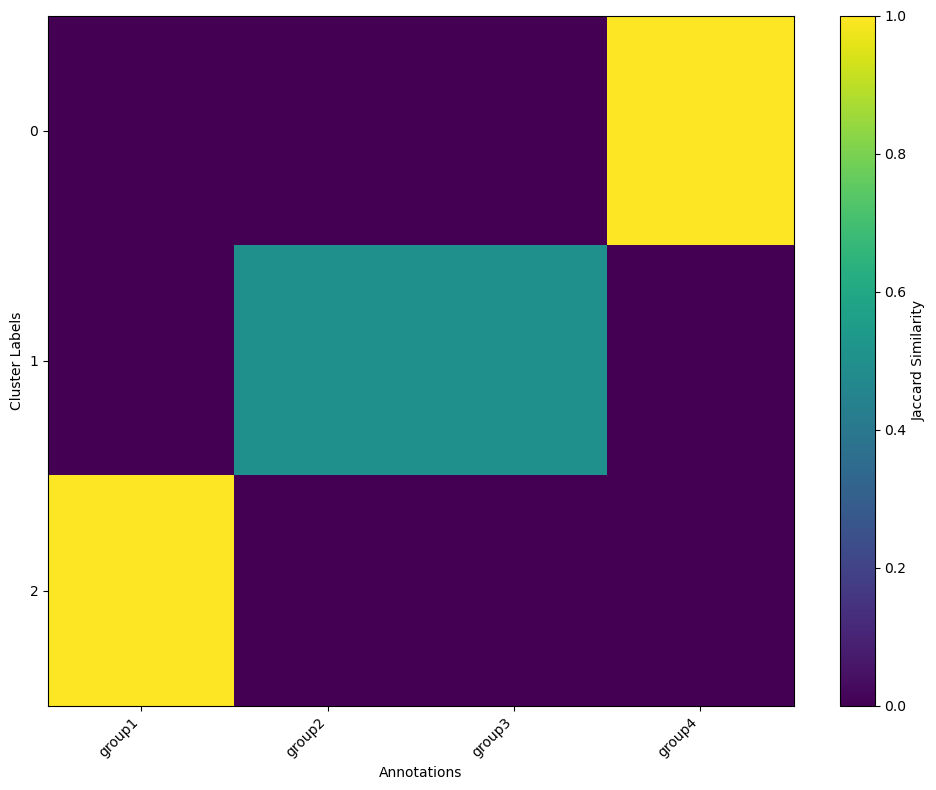

In [ ]:
jaccard_matrix, labels1, labels2 = calculate_jaccard_similarity(cluster_labels, np.array(annotations))
plot_heatmap(jaccard_matrix, labels2, labels1)

In [ ]:
for i in range(3):
    count = np.sum(cluster_labels == i)
    print(f"Cluster {i}: {count} data points")

Cluster 0: 20 data points
Cluster 1: 40 data points
Cluster 2: 20 data points
